In [9]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np

In [ ]:
data = pd.read_excel('TrainingData.xlsx')

In [21]:
data.replace('missing', np.nan, inplace=True)
data.replace('na', np.nan, inplace=True)
int_cols = list(set(data.columns) - {'mvar47'})
data[int_cols] = data[int_cols].astype(float)

In [44]:
def rnp(X, y, baskets=10):
    n = len(X)
    basket_size = int(n/baskets)
    sorted_indices = np.argsort(X)
    Y = y[sorted_indices]
    fractions_k = []
    for array in np.split(Y[0:(baskets)*basket_size], baskets):
        fractions_k.append(np.sum(array)/basket_size)
#     for k in range(1,baskets+1):
#         y_k = y[sorted_indices[(k-1)*basket_size:k*basket_size]]
#         fractions_k.append(np.sum(y_k)/basket_size)
    plt.plot(list(range(1,baskets+1)), fractions_k)
    plt.xlabel('Basket Index')
    plt.ylabel('Fraction of defaulters')

c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<Figure size 1080x1080 with 0 Axes>

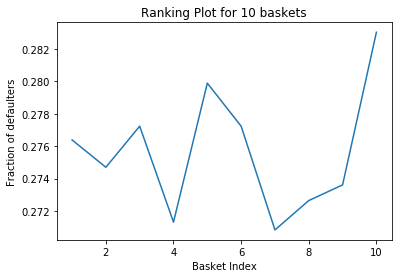

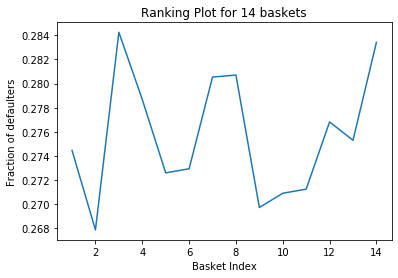

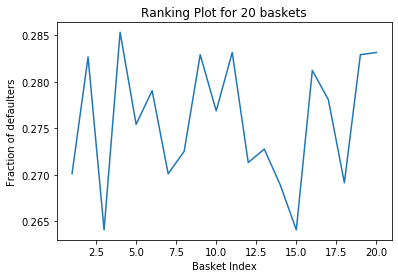

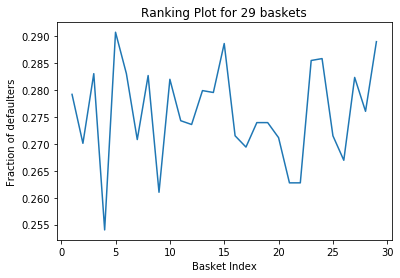

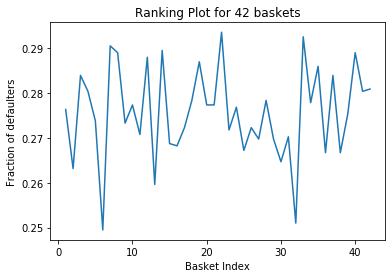

...

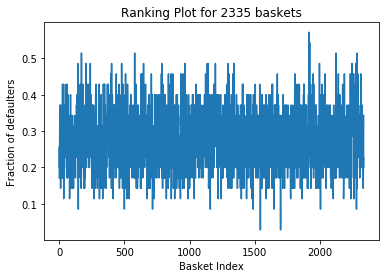

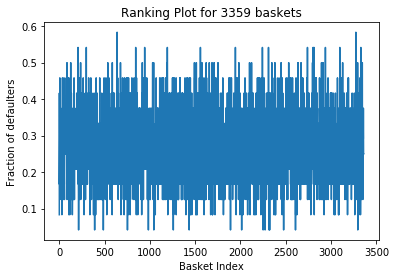

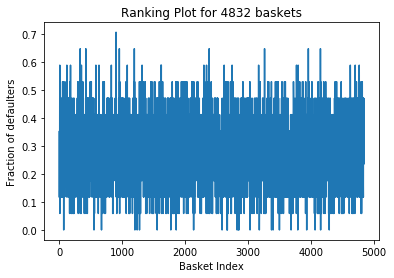

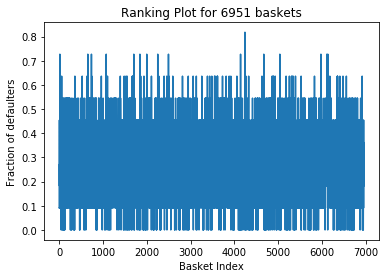

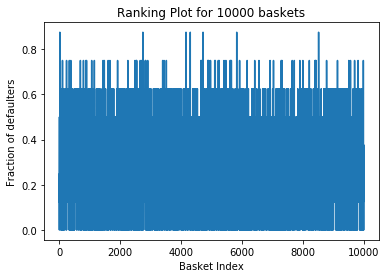

In [47]:
# mvar1 = credit score
plt.figure(figsize=(15,15))
basket_nums = np.logspace(start=1, stop=4, num=20, dtype=int)
for num in basket_nums:
    plt.figure()
    plt.title('Ranking Plot for '+str(num)+' baskets')
    rnp(data['mvar1'], data['default_ind'], baskets=num)
    

c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<Figure size 1080x1080 with 0 Axes>

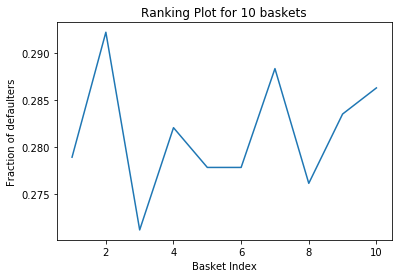

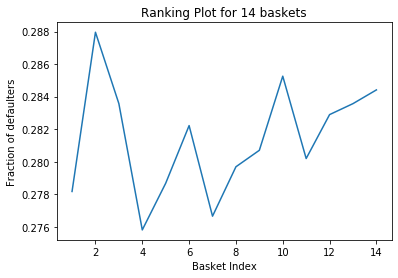

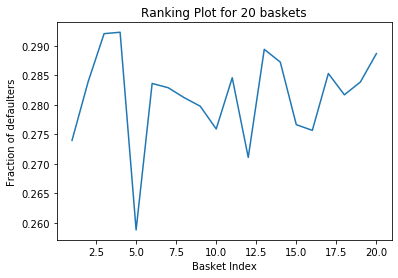

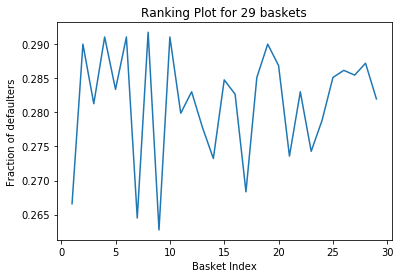

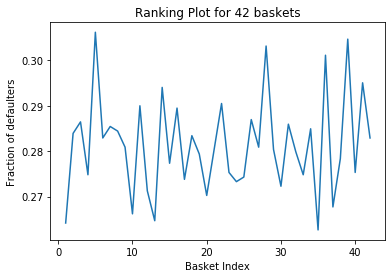

...

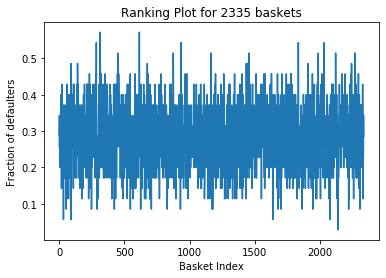

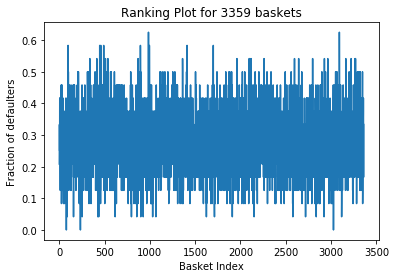

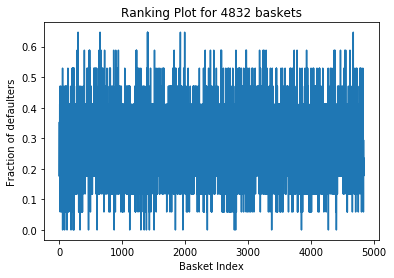

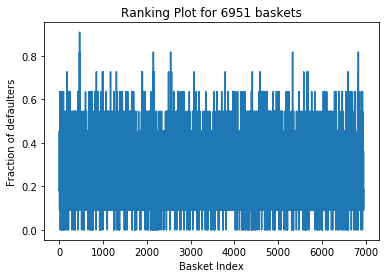

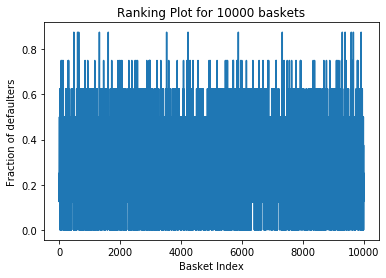

In [48]:
# mvar42 = financial stress index 
plt.figure(figsize=(15,15))
basket_nums = np.logspace(start=1, stop=4, num=20, dtype=int)
for num in basket_nums:
    plt.figure()
    plt.title('Ranking Plot for '+str(num)+' baskets')
    rnp(data['mvar42'], data['default_ind'], baskets=num)

c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\pandas\core\series.py:1139: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]
c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


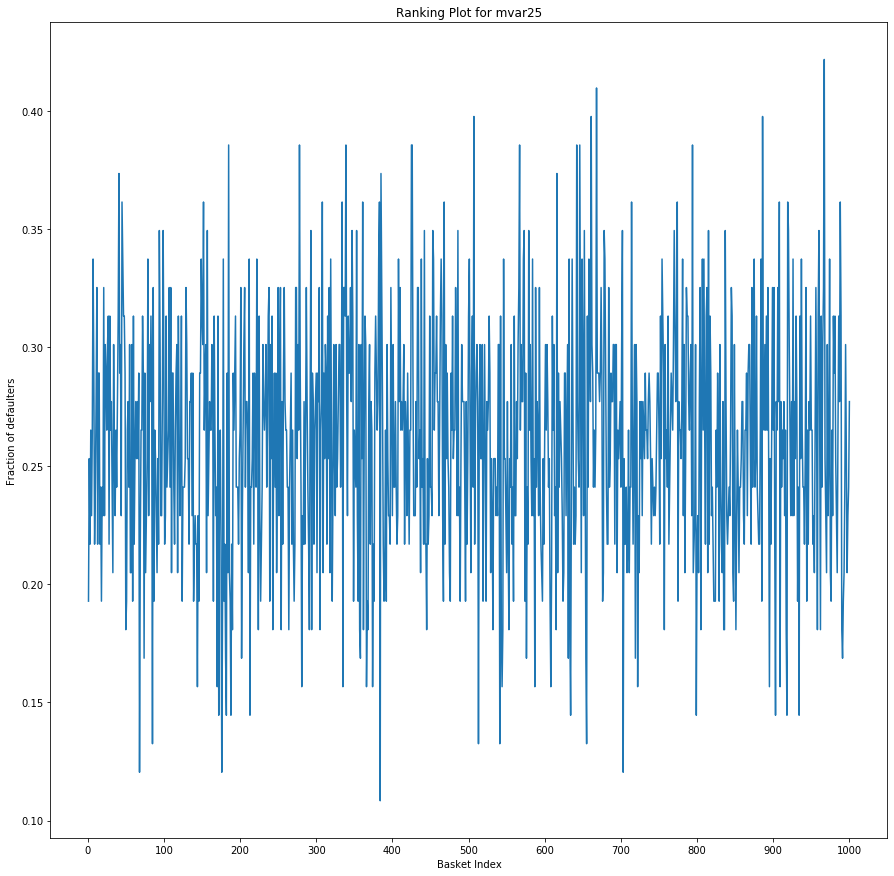

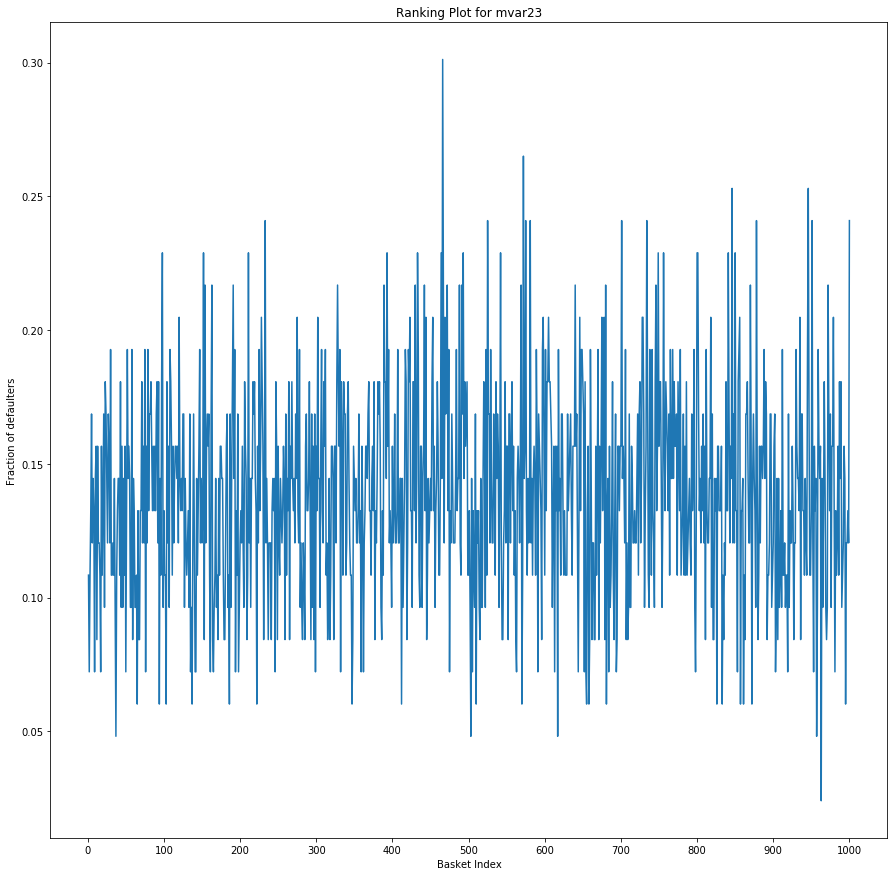

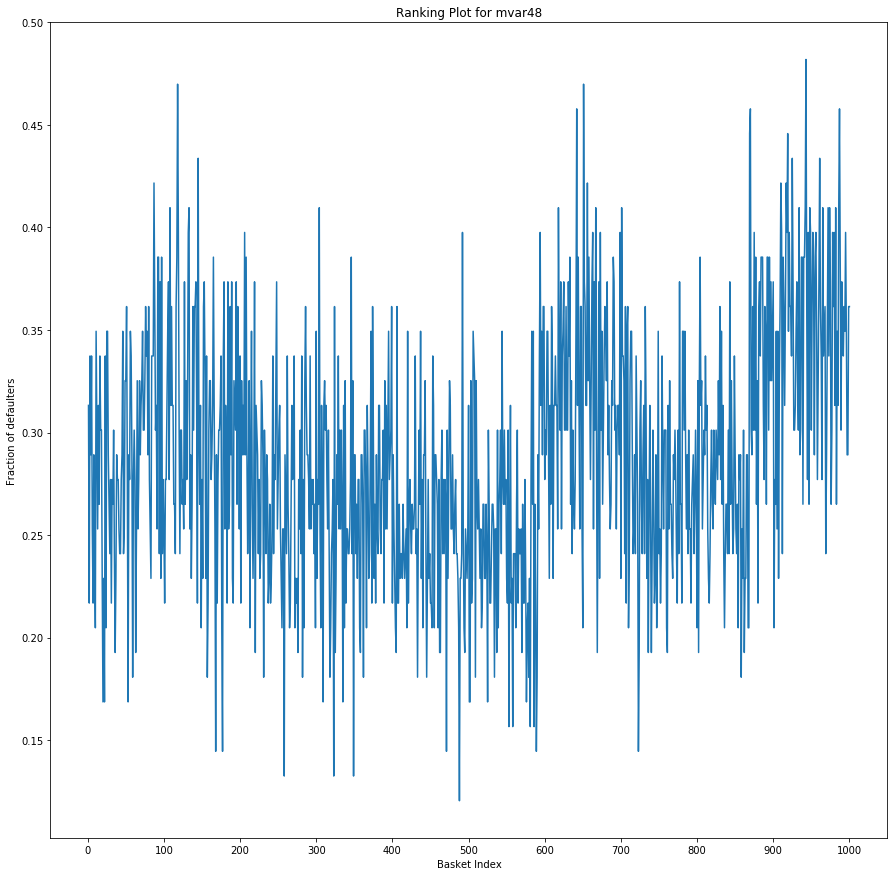

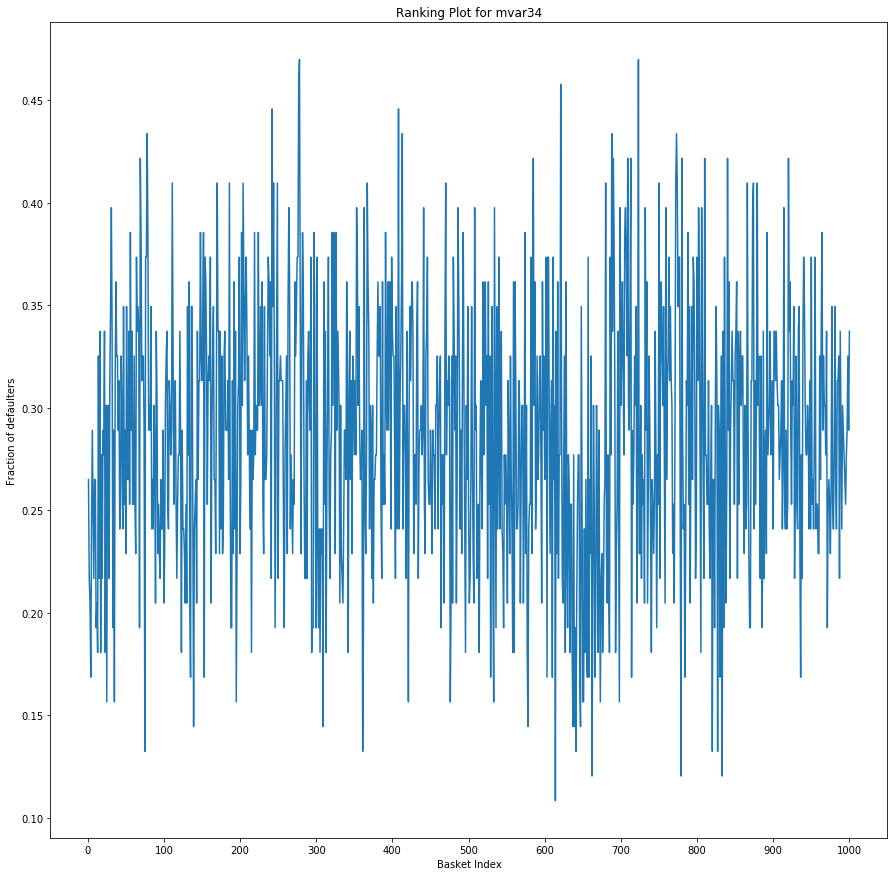

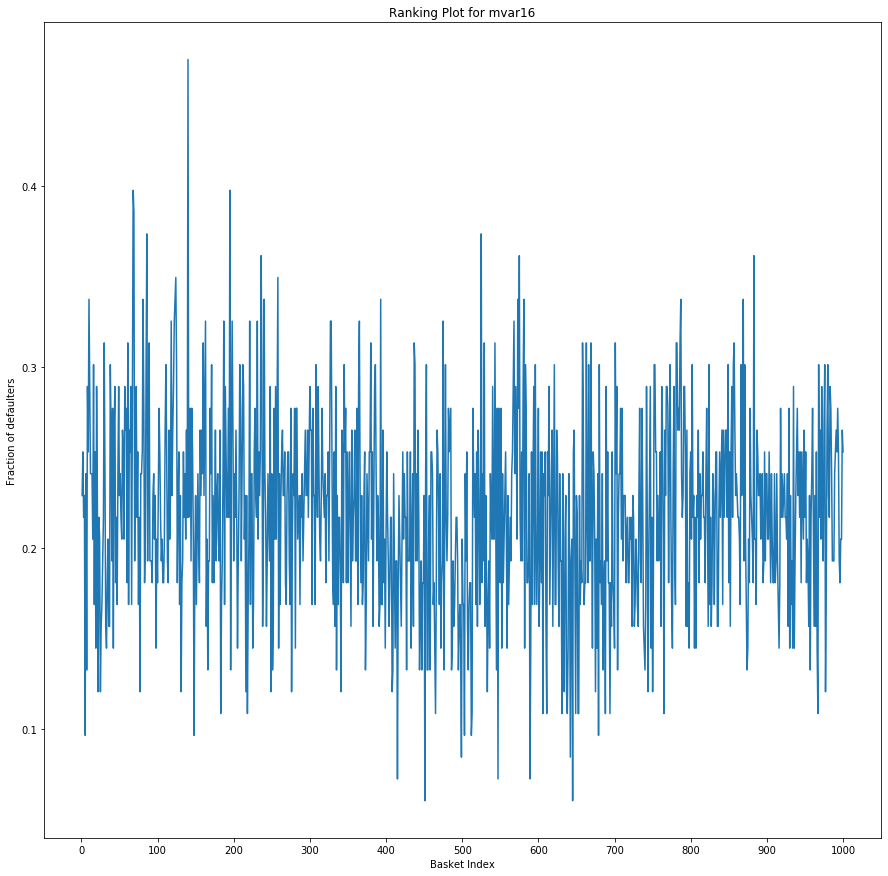

...

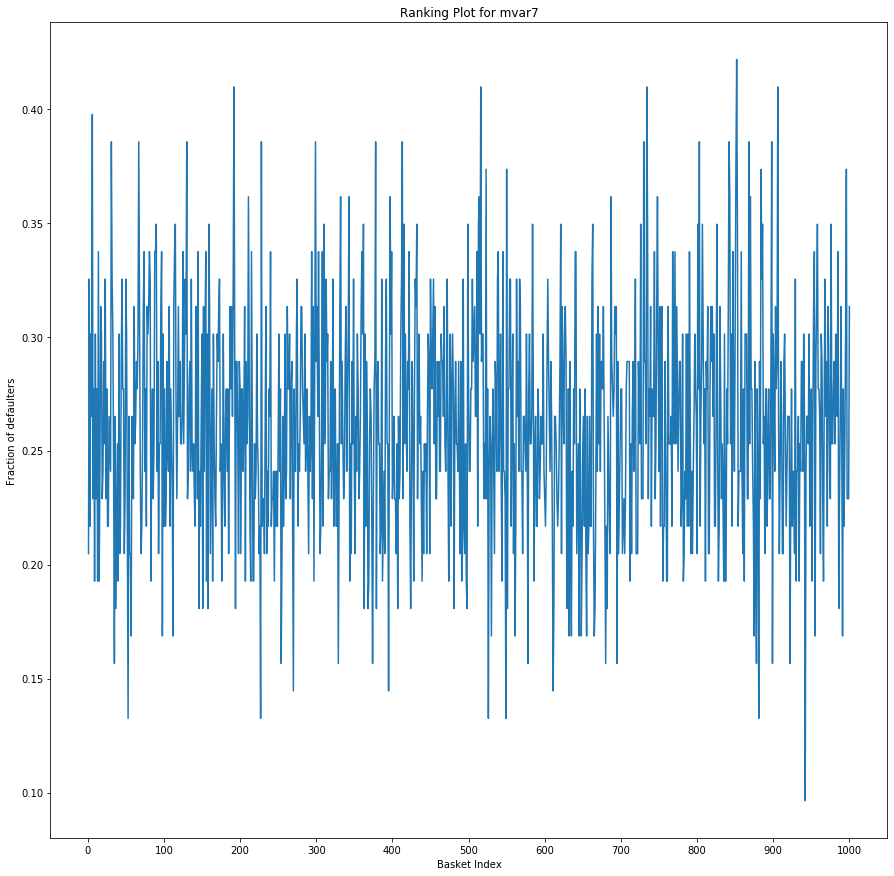

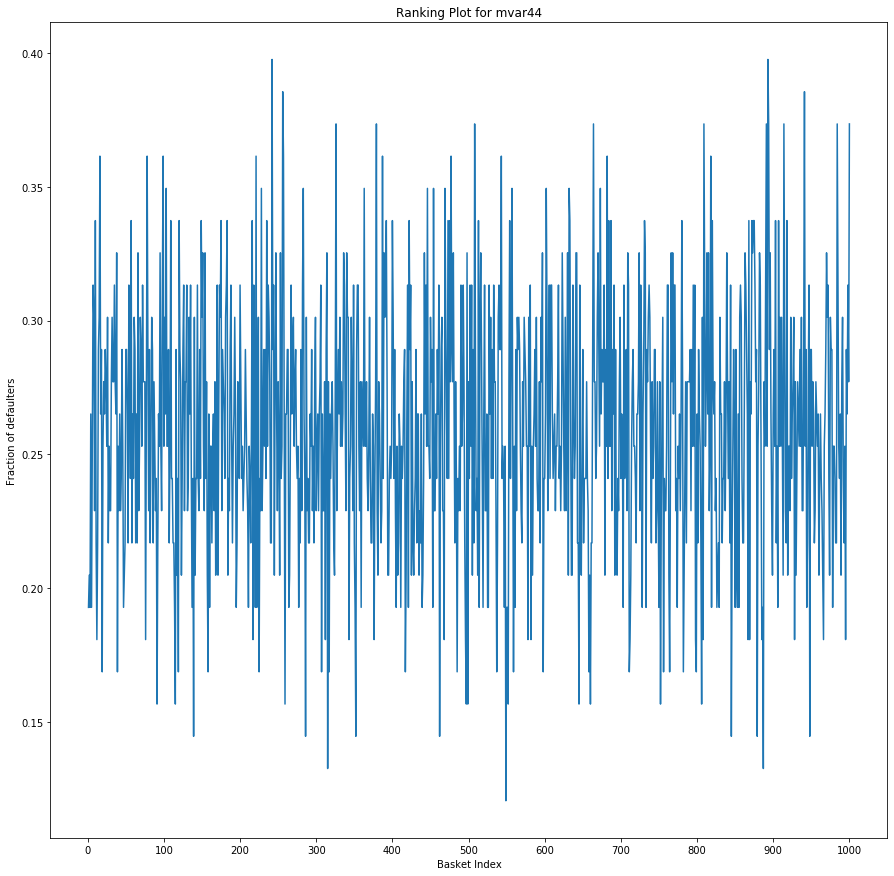

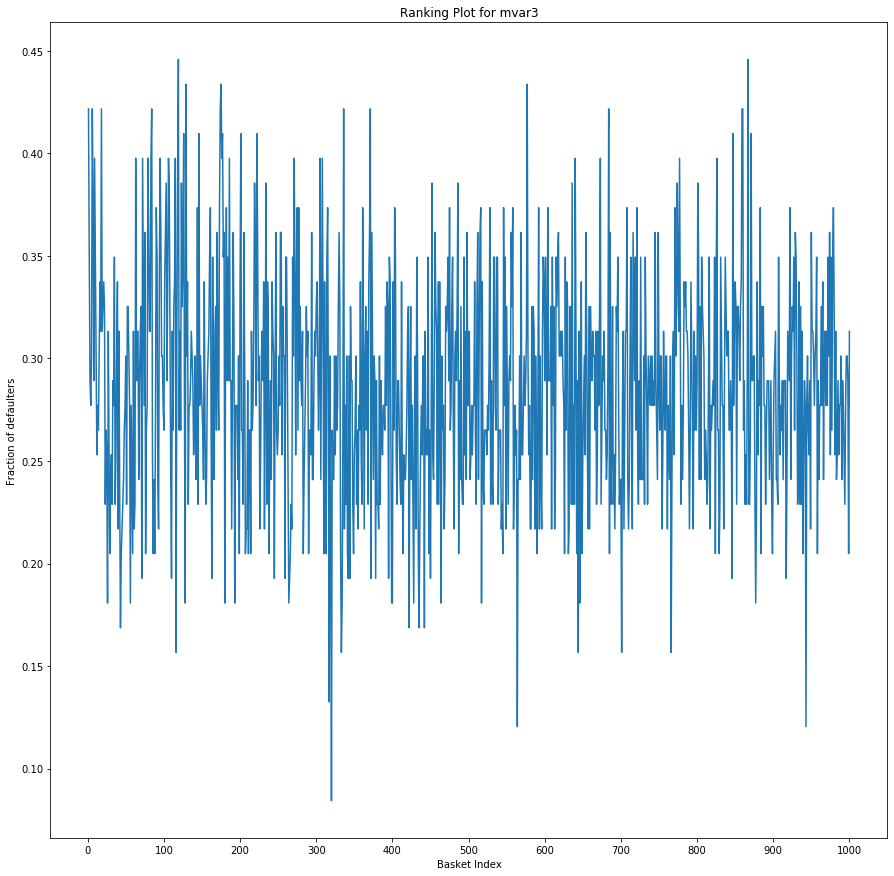

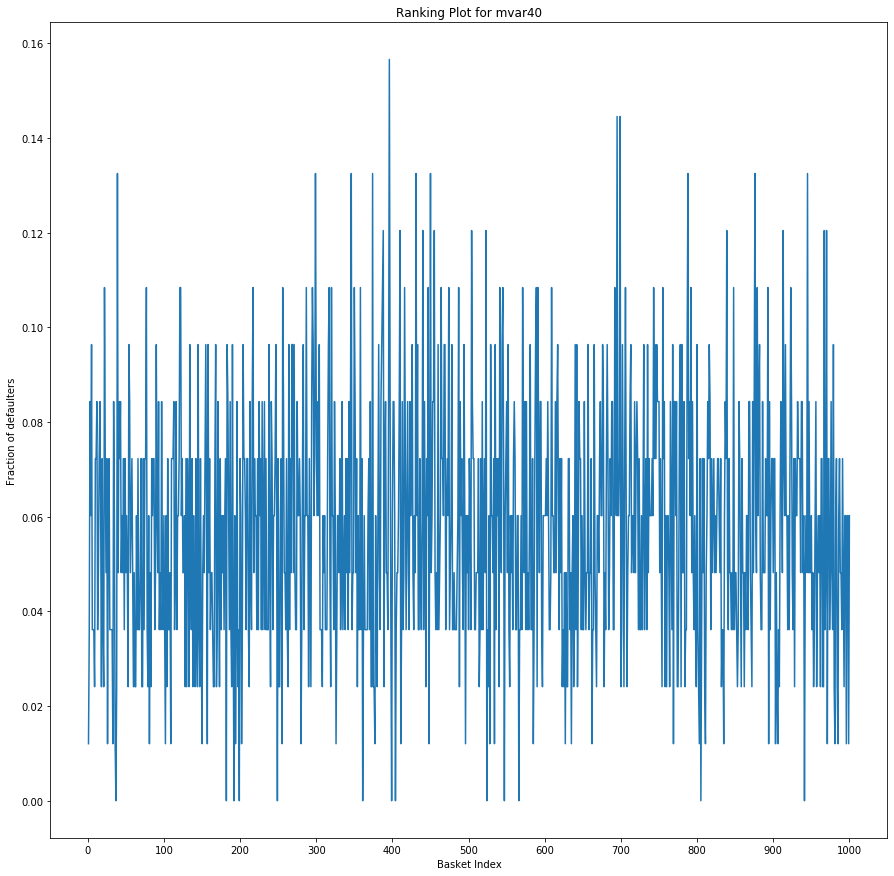

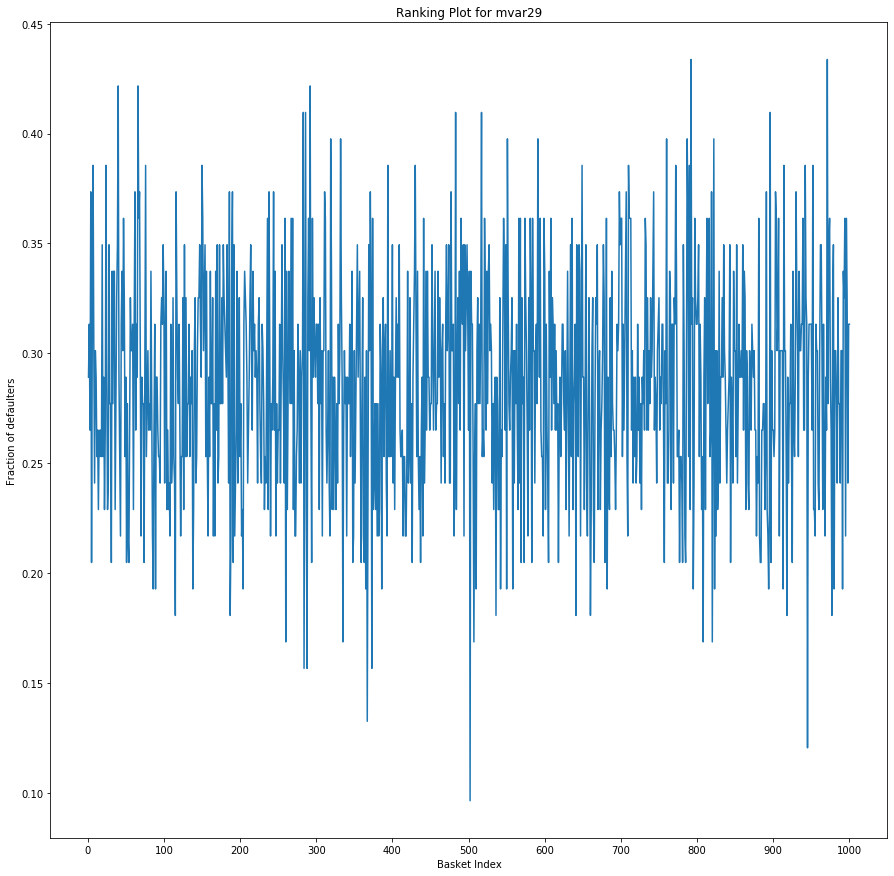

In [53]:
col_names = list(set(data.columns)-{'mvar47'})
for col in col_names:
    plt.figure(figsize=(15,15))
    plt.xticks([0,100,200,300,400,500,600,700,800,900,1000])
    plt.title('Ranking Plot for '+str(col))
    rnp(data[col], data['default_ind'], baskets=1000)